In [107]:
#import necessary packages
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.cm as cm
import seaborn as sns
import numpy as np

import scanpy.api as sc

import scipy
scipy.__version__

'1.2.2'

In [1198]:
#designate working directory 
#path should contain: matrix.mtx, plate_map.csv, cell_annotate.txt
#for scanpy annotations: barcodes.tsv, genes.tsv
#
#

#path='/Users/derekbogdanoff/projects/XYZeq/data/20190319_miSeq/human_mouse_gene_count/'
#path="./data/20190701/"
#path="./data/20190828/"
path="./data/20190917/"

In [1203]:
array_columns=['gene','cell','count']

count_matrix=pd.read_csv(path + 'matrix.mtx', sep=' ', header=None, index_col=None, skiprows=3, names=array_columns)

#check the format of the data
count_matrix.head()


,gene,cell,count
0,100629,1,1
1,100709,1,2
2,101247,1,1
3,101961,1,1
4,101971,1,3


number of UMIs total: 3908220.0
number of cells: 3021


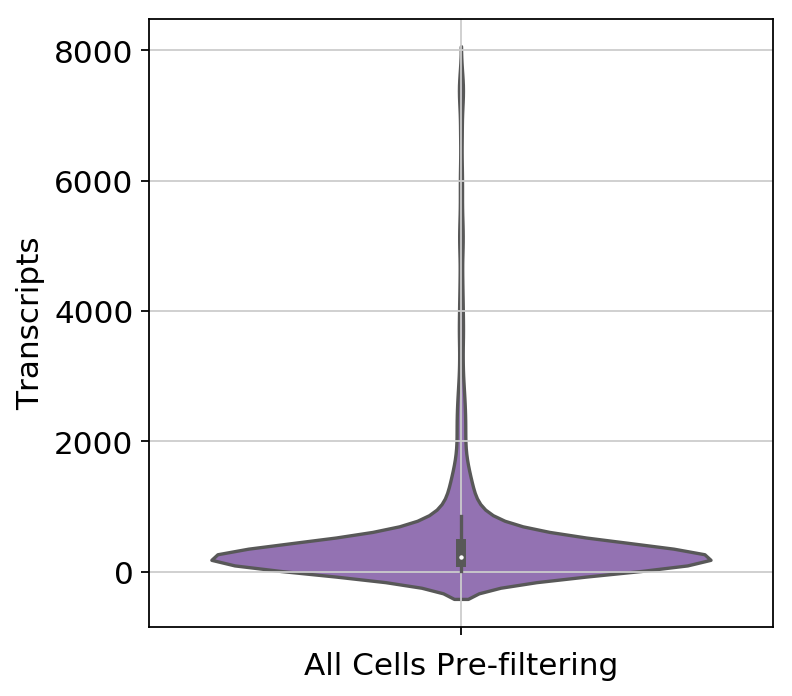

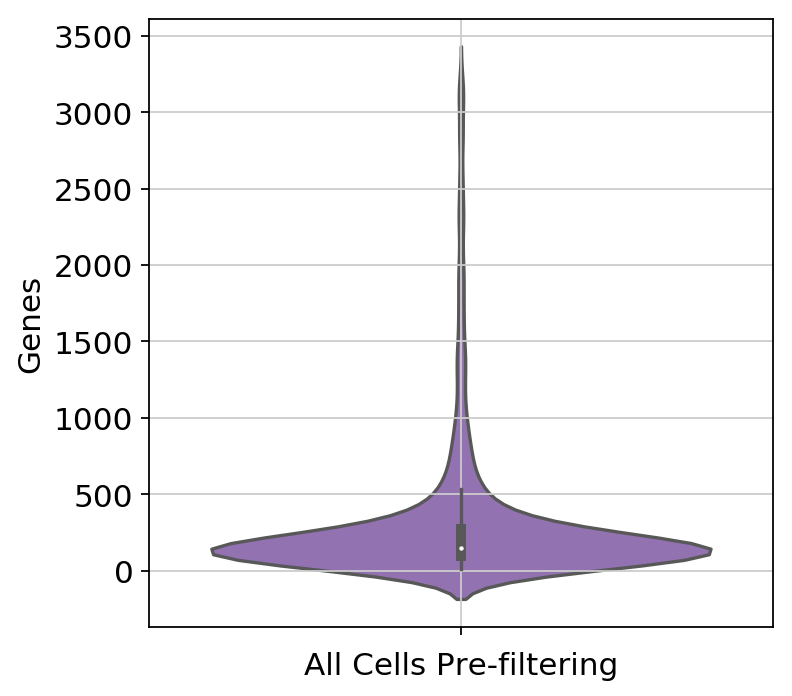

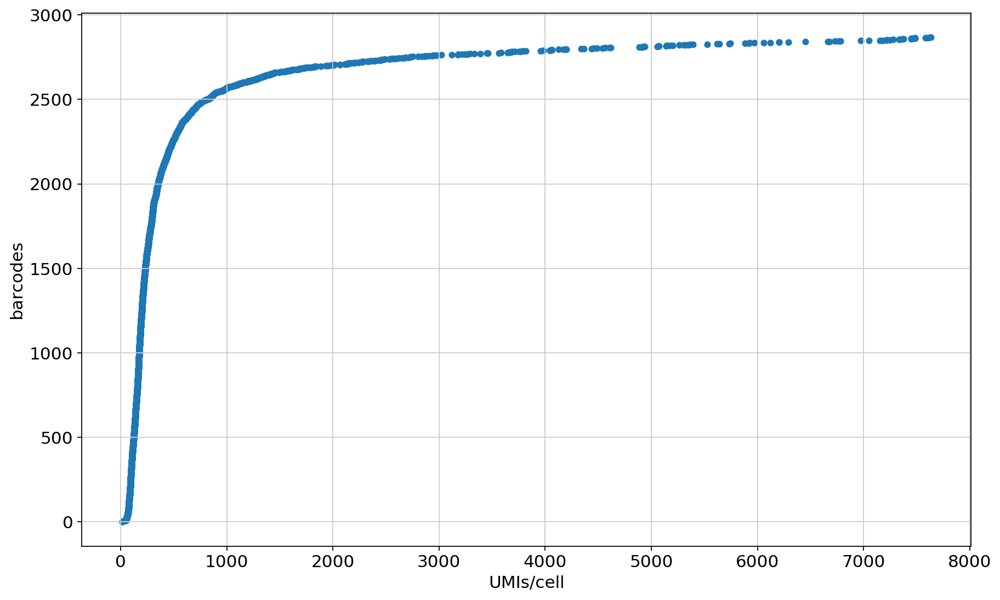

In [1200]:
##show some metrics for the data 

total_UMIS=count_matrix['count'].sum()
cell_number=count_matrix['cell'].nunique()


print("number of UMIs total:", total_UMIS)
print("number of cells:", cell_number)

plt.rcParams['figure.figsize'] = [5, 5]

#UMIs per cell
UMIs=count_matrix.groupby('cell')['count'].sum()

q=UMIs.quantile(.95)
UMIs=UMIs[UMIs < q]

ax=sns.violinplot(UMIs, orient='v', color='#9467bd')
ax.set(ylabel='Transcripts', xlabel='All Cells Pre-filtering')
plt.grid(True)
plt.show()

#genes per cell
genes=count_matrix.groupby('cell')['gene'].nunique()

q=genes.quantile(0.95)
genes=genes[genes < q]


ax=sns.violinplot(genes, orient='v', color='#9467bd')
ax.set(ylabel='Genes', xlabel='All Cells Pre-filtering')
plt.grid(True)
plt.show()



#make UMI knee plot

counts=UMIs.reset_index()
counts=counts.sort_values(by=['count'], axis=0, ascending=True)
counts=counts.reset_index()
counts=counts.drop('index',axis=1)
counts=counts.reset_index()
counts.columns=['barcodes','cell','UMIs/cell']
plt.rcParams['figure.figsize'] = [13, 8]
counts.plot.scatter(x='UMIs/cell',y='barcodes')



In [1227]:
pwd

'/Users/derekbogdanoff/projects/XYZeq'

In [1208]:
cd ./scripts/


/Users/derekbogdanoff/projects/XYZeq/scripts


In [1113]:
from hex_spatial_map import plot_spatial_array

In [1214]:
cd ..

/Users/derekbogdanoff/projects/XYZeq


In [1204]:
# plot_spatial_array(path+'matrix.mtx', path+'cell_annotate.txt', 
#                    path+'gene_name_annotate.txt', 
#                    path+'plate23_map.csv','mm10_Dpyd', 0)

In [1205]:
# plot_spatial_array(path+'matrix.mtx', path+'cell_annotate_L20C1.txt', 
#                    path+'gene_name_annotate.txt', 
#                    path+'plate23_map.csv','mm10_Ahnak', 0)

In [1285]:
ls -lt ./data/20190917

total 1540664
-rw-r--r--  1 derekbogdanoff  staff  387800582 Oct 16 01:08 matrix.mtx
-rw-r--r--@ 1 derekbogdanoff  staff       8507 Oct 14 12:48 lymphocyte_annotate_L20C1.txt
-rw-r--r--@ 1 derekbogdanoff  staff     940590 Oct  2 17:04 cell_annotate_L20C1.txt
-rw-r--r--@ 1 derekbogdanoff  staff    2315261 Sep 20 13:56 barcodes.tsv
-rw-r--r--  1 derekbogdanoff  staff    2035656 Sep 20 13:56 genes.tsv
-rw-r--r--  1 derekbogdanoff  staff    2777705 Sep 20 13:55 cell_annotate.txt
-rw-r--r--  1 derekbogdanoff  staff    8394019 Sep 20 13:54 gene_name_annotate.txt
-rw-r--r--  1 derekbogdanoff  staff  362600895 Sep 20 13:05 matrix_mergedIntron.mtx
-rw-r--r--@ 1 derekbogdanoff  staff      17111 Sep 19 02:07 plate23_map.csv


In [1400]:
sc.settings.verbosity=3
sc.settings.set_figure_params(dpi=80)
sc.logging.print_versions()
results_file = './write/results.h5ad'

#sc.settings = True

##load the data
adata=sc.read(path + 'matrix_mergedIntron.mtx', cache=False).T




# ##name the genes
adata.var_names = [gene.strip() for gene in open(path + 'genes.tsv', 'r')]


# ##name the cells
adata.obs_names = [barcode.strip() for barcode in open(path + 'barcodes.tsv', 'r')] 




scanpy==1.4.3 anndata==0.6.21 umap==0.3.9 numpy==1.17.2 scipy==1.2.2 pandas==0.23.4 scikit-learn==0.20.0 statsmodels==0.9.0 python-igraph==0.7.1 louvain==0.6.1 
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [1401]:
adata.var_names_make_unique()

In [1402]:
adata=adata[adata.obs_names.str.contains('L20C1')]

In [1403]:
adata.obs_names

Index(['L20C1_P1A01F.GACCGTCTCATAGCGC', 'L20C1_P1A01F.GCCTCTTAGATAGACA',
       'L20C1_P1A01F.GATCCGTCGTCAGACT', 'L20C1_P1A01F.GGTCACCACTTACAGT',
       'L20C1_P1A01F.TTACCGTTGGCCAATA', 'L20C1_P1A01F.TCAACAGAACCACCGA',
       'L20C1_P1A01F.GCAGTACAGACCAGGC', 'L20C1_P1A01F.TAGCCACAAGCGGACA',
       'L20C1_P1A01F.GTCCATGATTAGTAGC', 'L20C1_P1A01F.CTCCTGTCCAAGACAT',
       ...
       'L20C1_P4H12F.TCCACCGTATGCGCTG', 'L20C1_P4H12F.ATCTCTTGTCTTGGCG',
       'L20C1_P4H12F.CTCTTGGAGGTCTTCG', 'L20C1_P4H12F.TACCACGCCTACCAGC',
       'L20C1_P4H12F.CGAGGCTATGCGTTGG', 'L20C1_P4H12F.CTGGTAATAAGAGCGC',
       'L20C1_P4H12F.TACGTGCTAACTGCTA', 'L20C1_P4H12F.TCCGAACCGAGATTAA',
       'L20C1_P4H12F.CATGCGTGCTCTTACG', 'L20C1_P4H12F.ATCGAATGCGCCACCG'],
      dtype='object', length=26436)

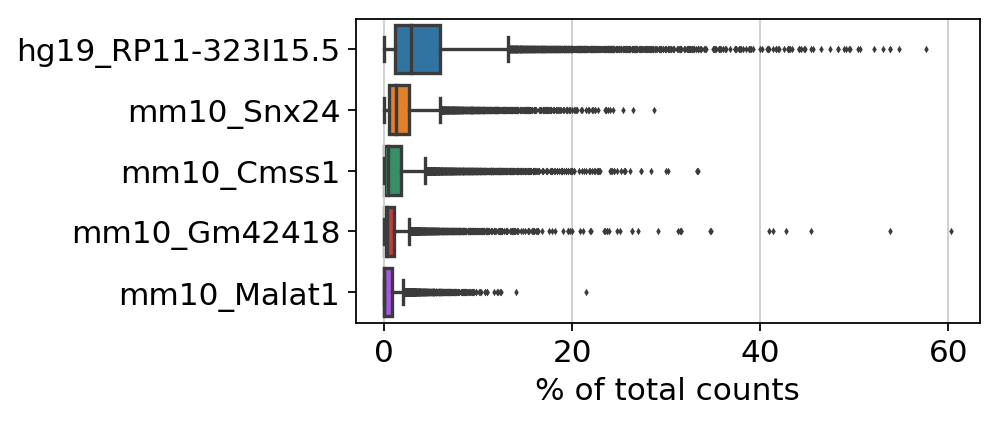

In [1404]:
sc.pl.highest_expr_genes(adata, n_top=5) 

In [1405]:
adata

View of AnnData object with n_obs × n_vars = 26436 × 121472 

In [1406]:
##post processing filter minimum UMIS and genes
sc.pp.filter_cells(adata, min_counts=500)#300
sc.pp.filter_cells(adata, min_genes=100)

#sc.pp.filter_cells(adata, max_counts=15000)
#sc.pp.filter_cells(adata, max_genes=2000) 

##post processing filter genes 
sc.pp.filter_genes(adata, min_cells=2)
#sc.pp.filter_genes(adata, max_cells=1000)   

## define mito genes 
mito_genes=[name for name in adata.var_names if name.startswith(('mm10_mt-', 'hg19_mt-', 'mt-'))]


##create new obs anotation to define percent mito for each cell 
adata.obs['percent_mito'] = np.sum(adata[:, mito_genes].X, axis=1) / np.sum(adata.X, axis=1)*100

##create new obs anotation to define UMIs per cell
adata.obs['n_counts'] = adata.X.sum(axis=1)



Trying to set attribute `.obs` of view, making a copy.


filtered out 18293 cells that have less than 500 counts
filtered out 3 cells that have less than 100 genes expressed
filtered out 71226 genes that are detected in less than 2 cells


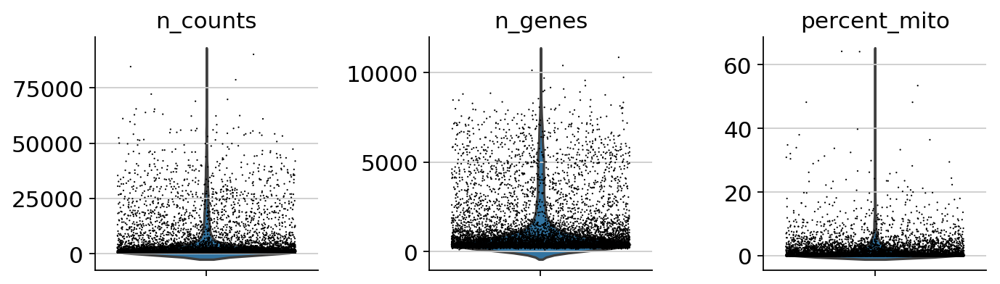

In [1407]:
sc.pl.violin(adata, ['n_counts', 'n_genes', 'percent_mito'], jitter=0.4, multi_panel=True)

In [1408]:
spec_filter= [name for name in adata.var_names if not name.startswith('mm10_Itgam')]
adata=adata[:, spec_filter]

In [1409]:
spec_filter= [name for name in adata.var_names if not name.startswith('mm10_Smim20')]
adata=adata[:, spec_filter]

In [1410]:
spec_filter= [name for name in adata.var_names if not name.startswith('hg19_RP11-323I15.5')]
adata=adata[:, spec_filter]

In [1411]:
##filter out outliers

adata = adata[adata.obs['n_genes'] < 15000, :]
adata = adata[adata.obs['n_counts'] < 10000, :]
adata = adata[adata.obs['percent_mito'] < 1, :]


/Users/derekbogdanoff/projects/venv3/lib/python3.7/site-packages/scanpy/plotting/_anndata.py:311: DeprecationWarning: Use obs_vector instead of _get_obs_array, _get_obs_array will be removed in the future.
  x_arr = adata._get_obs_array(x, use_raw=use_raw, layer=layers[0])
/Users/derekbogdanoff/projects/venv3/lib/python3.7/site-packages/anndata/base.py:1618: FutureWarning: In a future version of AnnData, access to `.X` by passing `layer='X'` will be removed. Instead pass `layer=None`.
  FutureWarning
/Users/derekbogdanoff/projects/venv3/lib/python3.7/site-packages/scanpy/plotting/_anndata.py:312: DeprecationWarning: Use obs_vector instead of _get_obs_array, _get_obs_array will be removed in the future.
  y_arr = adata._get_obs_array(y, use_raw=use_raw, layer=layers[1])
/Users/derekbogdanoff/projects/venv3/lib/python3.7/site-packages/anndata/base.py:1618: FutureWarning: In a future version of AnnData, access to `.X` by passing `layer='X'` will be removed. Instead pass `layer=None`.
  Fu

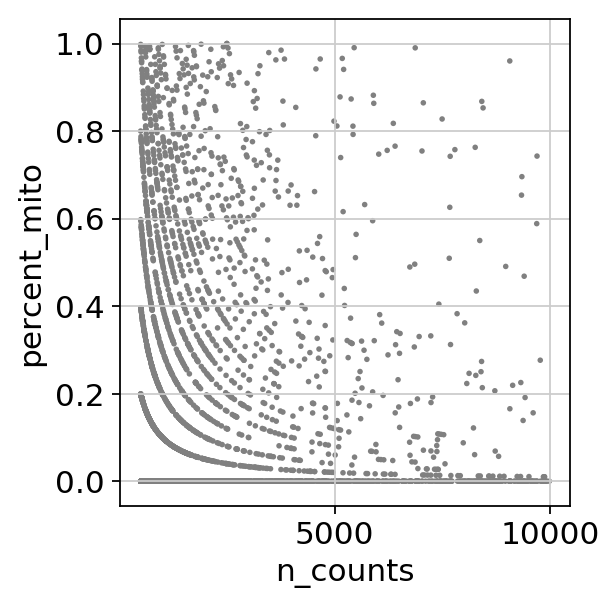

/Users/derekbogdanoff/projects/venv3/lib/python3.7/site-packages/scanpy/plotting/_anndata.py:311: DeprecationWarning: Use obs_vector instead of _get_obs_array, _get_obs_array will be removed in the future.
  x_arr = adata._get_obs_array(x, use_raw=use_raw, layer=layers[0])
/Users/derekbogdanoff/projects/venv3/lib/python3.7/site-packages/anndata/base.py:1618: FutureWarning: In a future version of AnnData, access to `.X` by passing `layer='X'` will be removed. Instead pass `layer=None`.
  FutureWarning
/Users/derekbogdanoff/projects/venv3/lib/python3.7/site-packages/scanpy/plotting/_anndata.py:312: DeprecationWarning: Use obs_vector instead of _get_obs_array, _get_obs_array will be removed in the future.
  y_arr = adata._get_obs_array(y, use_raw=use_raw, layer=layers[1])
/Users/derekbogdanoff/projects/venv3/lib/python3.7/site-packages/anndata/base.py:1618: FutureWarning: In a future version of AnnData, access to `.X` by passing `layer='X'` will be removed. Instead pass `layer=None`.
  Fu

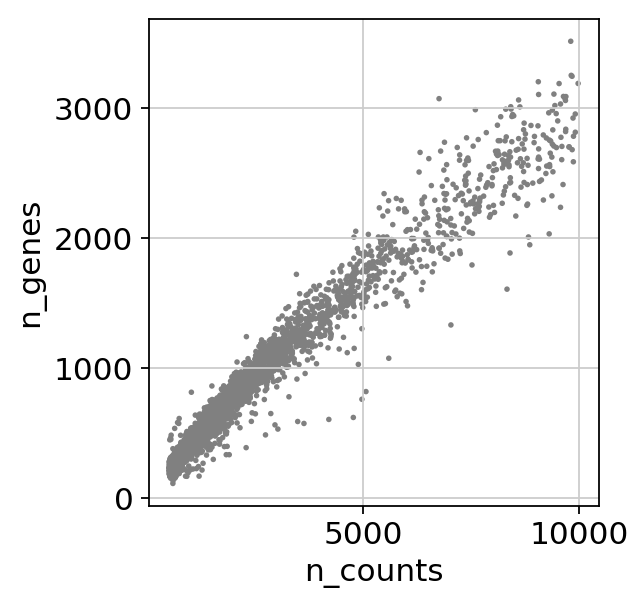

In [1412]:
sc.pl.scatter(adata, x='n_counts', y='percent_mito')
sc.pl.scatter(adata, x='n_counts', y='n_genes')



In [1413]:
adata

AnnData object with n_obs × n_vars = 4788 × 50241 
    obs: 'n_counts', 'n_genes', 'percent_mito'
    var: 'n_cells'

In [1414]:
#barnyard


mouse_genes=[name for name in adata.var_names if name.startswith('mm10_')]
human_genes=[name for name in adata.var_names if name.startswith('hg19_')]



adata.obs['mouse_counts'] = np.sum(adata[:, mouse_genes].X, axis=1)
adata.obs['human_counts'] = np.sum(adata[:, human_genes].X, axis=1)



In [1415]:
# # fig, ax = plt.subplots(figsize=(6, 1))
# fig.subplots_adjust(bottom=0.5)

cmap = mpl.colors.ListedColormap(['royalblue','lightgrey', 'orangered'])


In [1416]:

np.seterr(divide = 'ignore') 
adata.obs['ratio'] = np.log10(np.true_divide(adata.obs['mouse_counts'], adata.obs['human_counts']))


def cell_call(counts):
        if counts['ratio'] > 0.66:
                return 'M'
        elif counts['ratio'] < -0.66:
                return 'H'
        else:
                return 'C'

            
            
            
adata.obs['cell_call']=adata.obs.apply(lambda counts: cell_call(counts), axis=1)




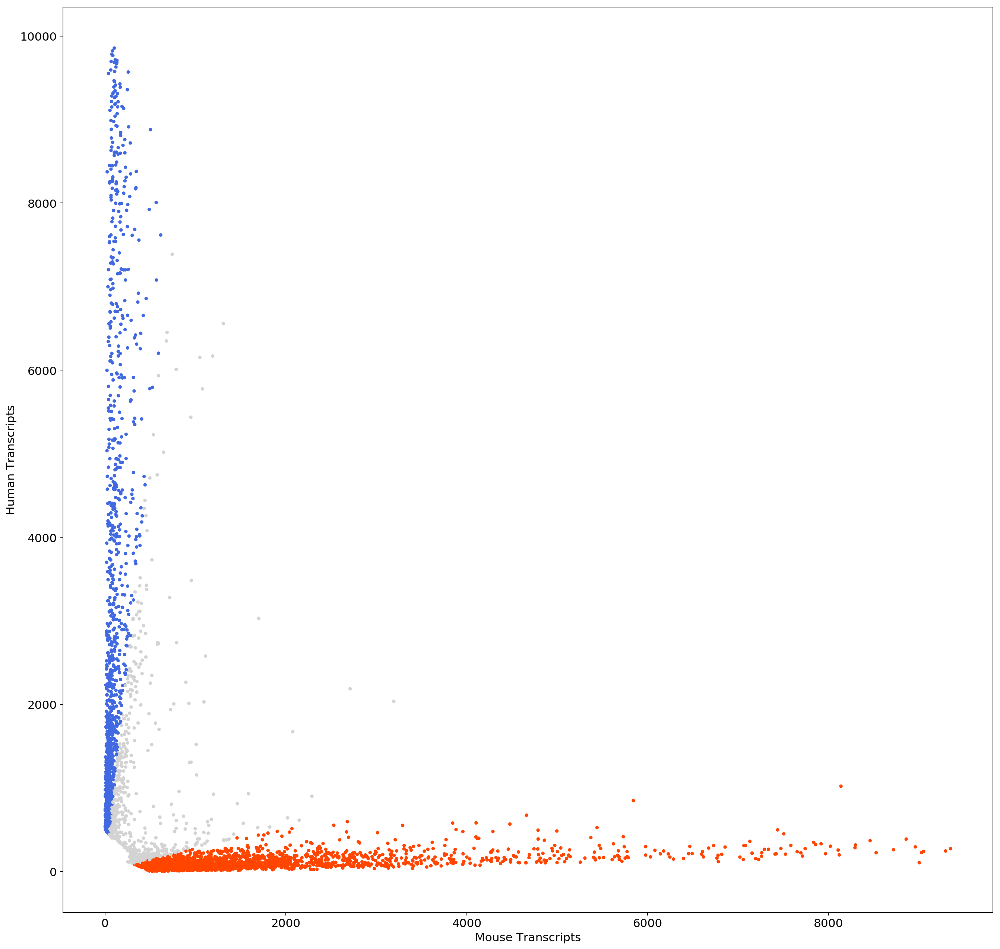

In [1417]:
plt.rcParams['figure.figsize'] = [20, 20]

plt.scatter(x=adata.obs['mouse_counts'], 
            y=adata.obs['human_counts'],
            s=10,
            c=adata.obs['ratio'],
           cmap=cmap)


plt.xlabel('Mouse Transcripts')
plt.ylabel('Human Transcripts')
plt.grid(b=False)

#plt.savefig('/Users/derekbogdanoff/Desktop/test.svg', bbox_inches='tight')


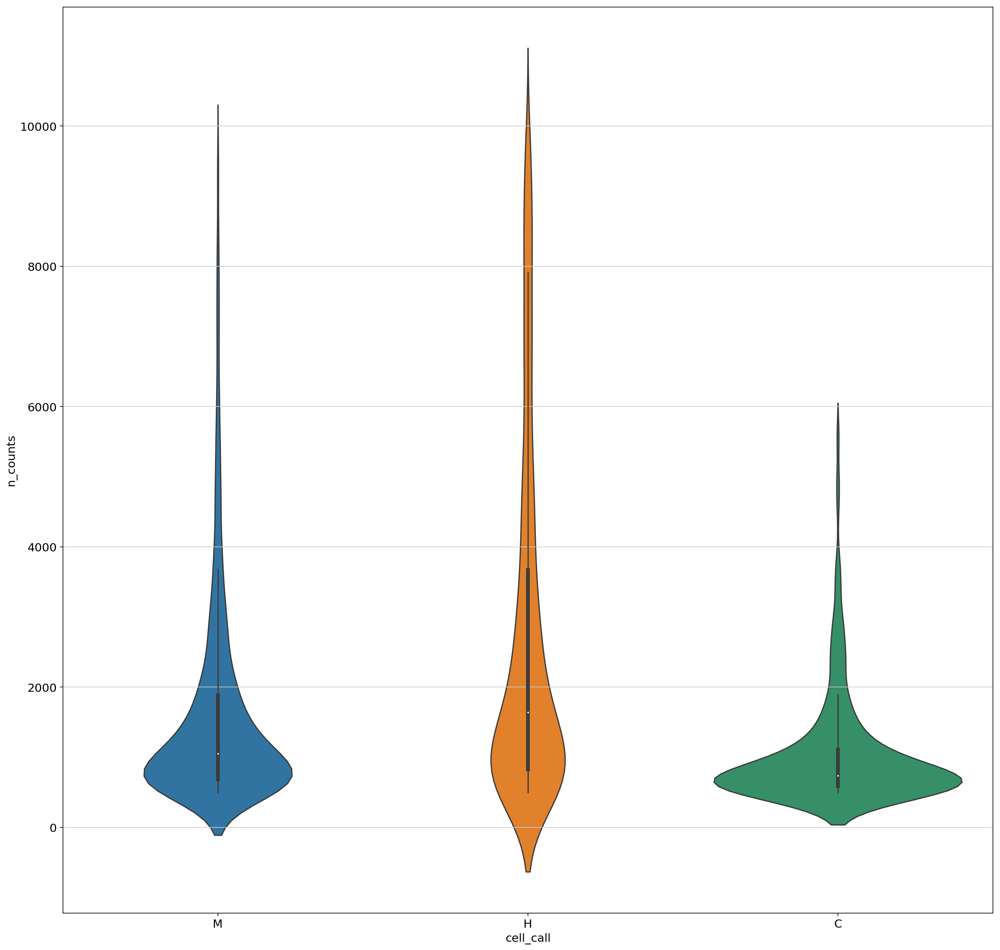

In [1418]:
sns.violinplot(data=adata.obs,
               x='cell_call',
               y='n_counts',
 #              palette=['lightgrey','royalblue', 'orangered']
              )

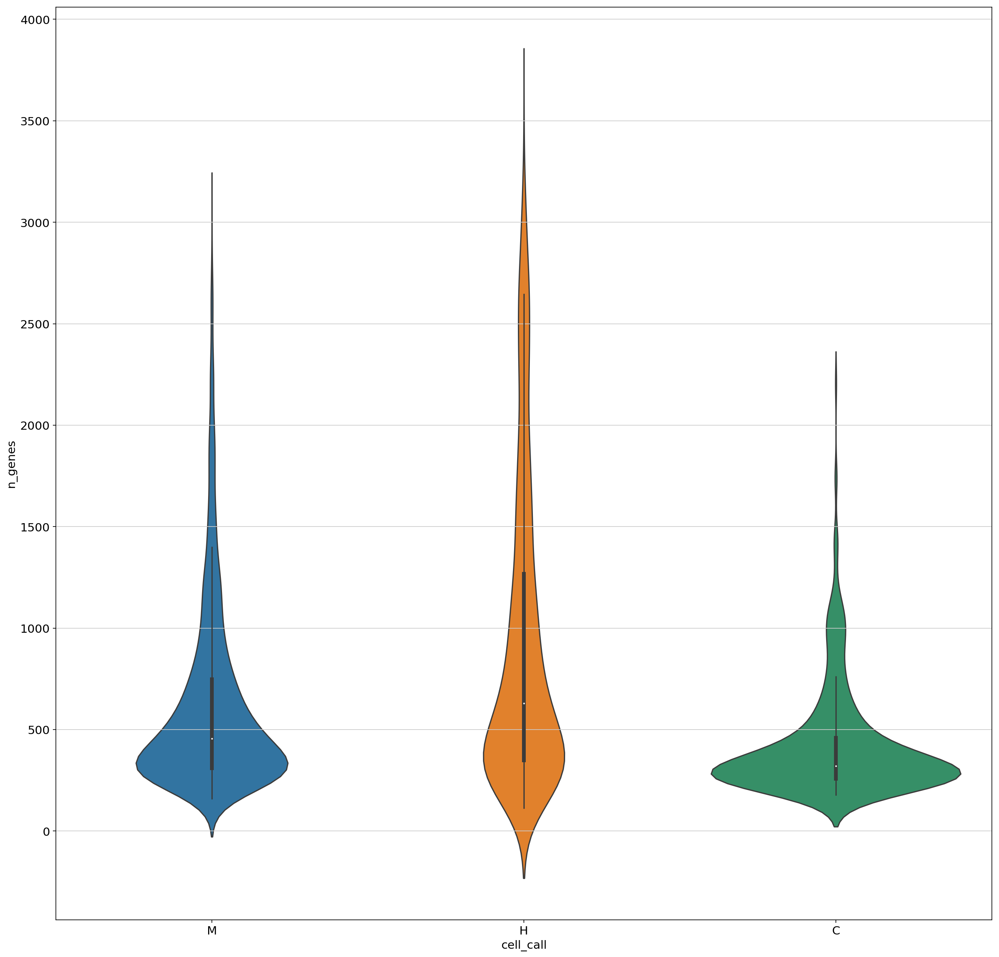

In [1419]:
sns.violinplot(data=adata.obs,x='cell_call',y='n_genes')

In [1420]:
adata.obs['cell_call'].value_counts()

M    2700
H    1625
C     463
Name: cell_call, dtype: int64

In [1421]:
np.median(adata[adata.obs['cell_call']=='M'].obs.n_genes)

456.0

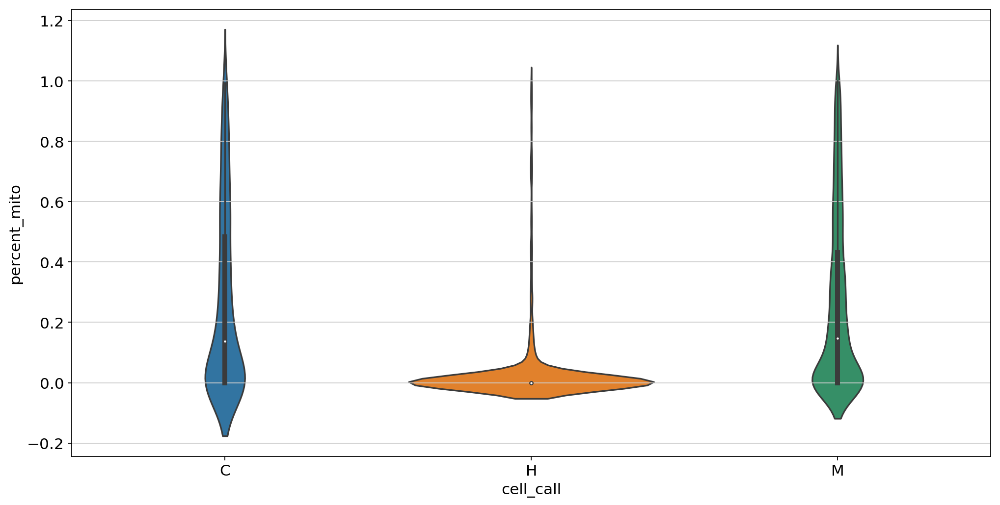

In [1473]:
sns.violinplot(data=adata.obs,x='cell_call',y='percent_mito')

In [1422]:
##create raw data file

adata.raw = sc.pp.log1p(adata, copy=True)




In [1423]:
##normalize counts per cell to 10K each 

sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)



In [1424]:
print(adata.X.sum(axis=1))

[[10000.   ]
 [ 9999.999]
 [ 9999.999]
 ...
 [10000.   ]
 [10000.   ]
 [10000.002]]


In [1425]:
adata.shape

(4788, 50241)

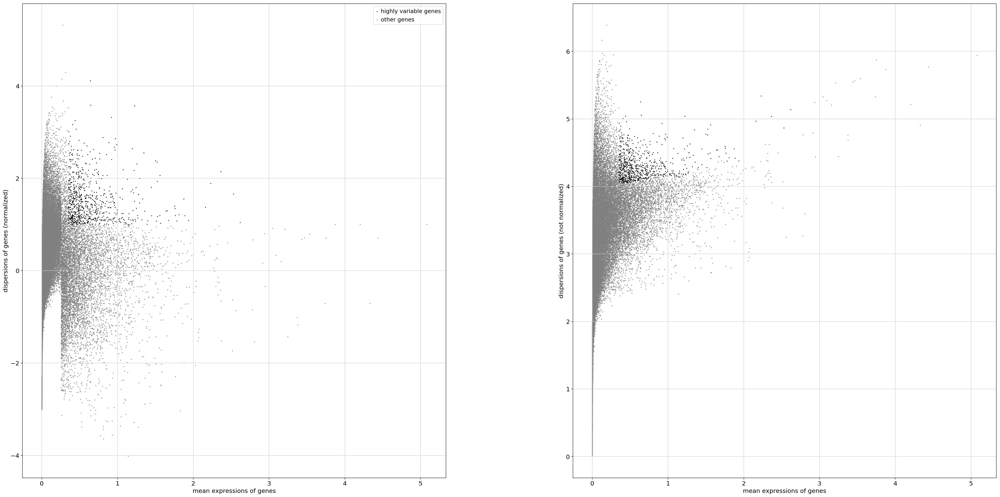

In [1426]:

filter_result = sc.pp.filter_genes_dispersion(
    adata.X, min_mean=0.35, max_mean=7, min_disp=1) ####L20C1 parameters 

    
    
sc.pl.filter_genes_dispersion(filter_result)


In [1427]:
filter_result

rec.array([(False, 1.1702676e-03, 0.3601469, -2.6226435 ),
           (False, 1.0000000e-12,       nan,         nan),
           (False, 1.1697747e-02, 2.2933307, -0.49871537), ...,
           (False, 1.4190648e+00, 3.334681 , -1.4423524 ),
           (False, 2.6195091e-01, 3.5203967, -0.20583872),
           (False, 3.8959142e-03, 2.3415518, -0.44573635)],
          dtype=[('gene_subset', '?'), ('means', '<f4'), ('dispersions', '<f4'), ('dispersions_norm', '<f4')])

In [1428]:
sum(filter_result.gene_subset)

789

In [1429]:
#percent of genes that are highly variable
sum(filter_result.gene_subset)/len(filter_result.gene_subset)*100

1.570430524870126

In [1430]:
adata = adata[:, filter_result.gene_subset]

In [1431]:
adata

View of AnnData object with n_obs × n_vars = 4788 × 789 
    obs: 'n_counts', 'n_genes', 'percent_mito', 'mouse_counts', 'human_counts', 'ratio', 'cell_call'
    var: 'n_cells'

In [1432]:
sc.pp.log1p(adata)

In [1433]:
adata.X


<4788x789 sparse matrix of type '<class 'numpy.float32'>'
	with 172497 stored elements in Compressed Sparse Row format>

In [1434]:
#Regress out unwanted sources of variation
sc.pp.regress_out(adata, ['n_counts', 'percent_mito'])

... storing 'cell_call' as categorical


regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:00:03.21)


In [1435]:
sc.pp.scale(adata, max_value=10)

In [1436]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA with n_comps = 50
    finished (0:00:00.46)


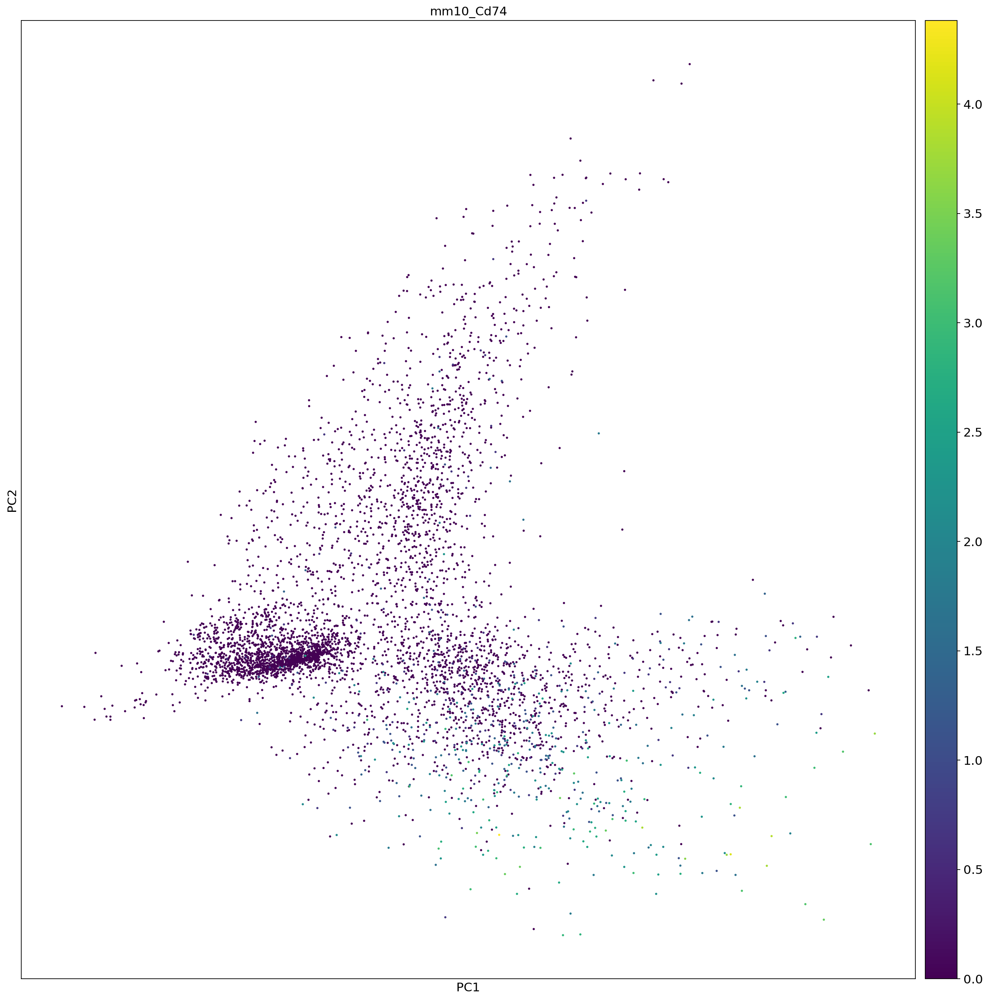

In [1437]:
sc.pl.pca(adata,color='mm10_Cd74')

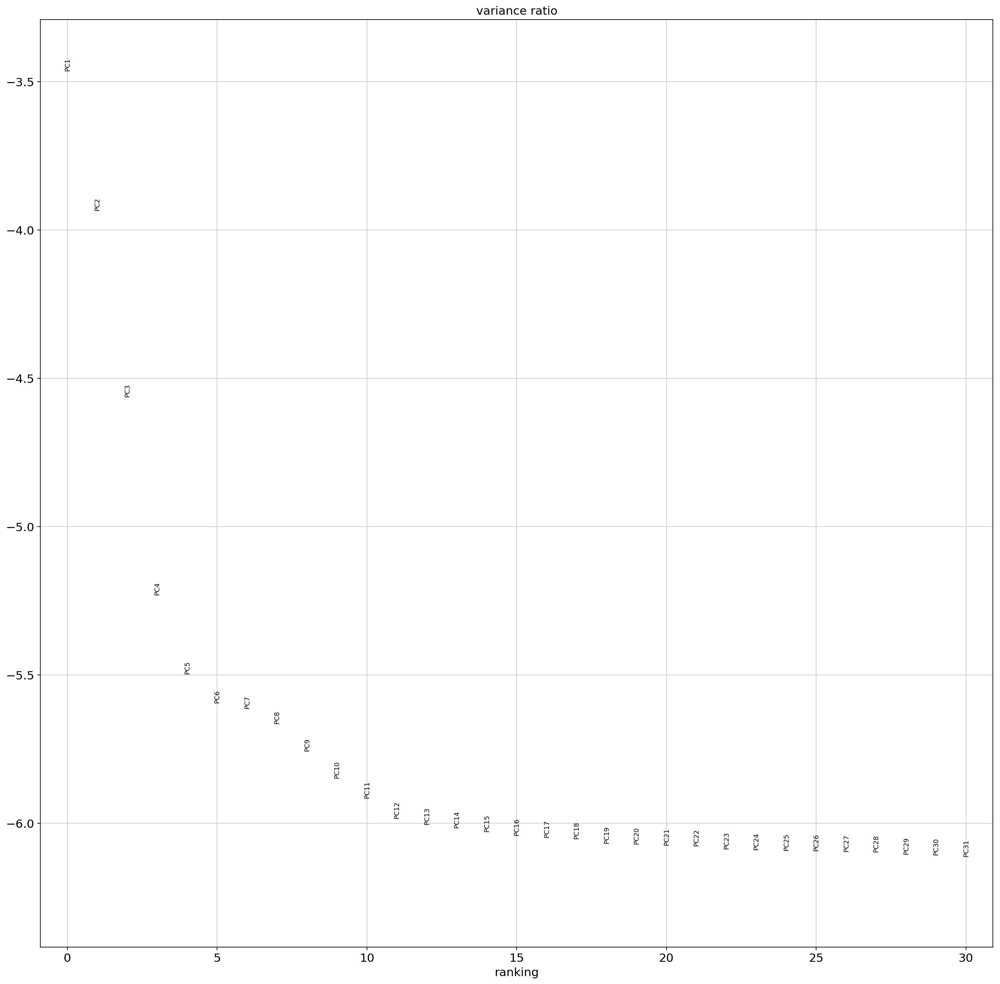

In [1438]:
sc.pl.pca_variance_ratio(adata, log=True)

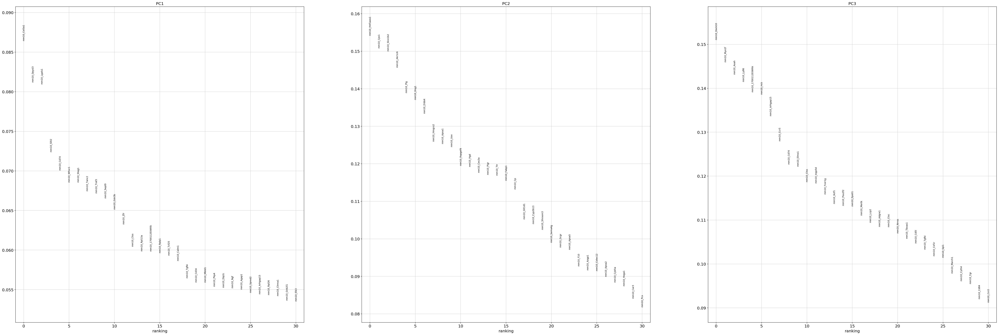

In [1439]:
sc.pl.pca_loadings(adata)

In [1440]:
sc.pp.neighbors(adata, n_neighbors=12, n_pcs=10)

computing neighbors
    using 'X_pca' with n_pcs = 10
    finished (0:00:00.53) --> added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix


In [1441]:
sc.tl.leiden(adata, resolution=0.6)

running Leiden clustering
    finished (0:00:00.63) --> found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical)


In [1442]:
sc.tl.louvain(adata, resolution=0.8)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00.37) --> found 13 clusters and added
    'louvain', the cluster labels (adata.obs, categorical)


In [1443]:
sc.tl.umap(adata,
            min_dist=.1,
            spread=2,
            alpha=2,
            )

computing UMAP
    using 'X_pca' with n_pcs = 10
    finished (0:00:05.89) --> added
    'X_umap', UMAP coordinates (adata.obsm)


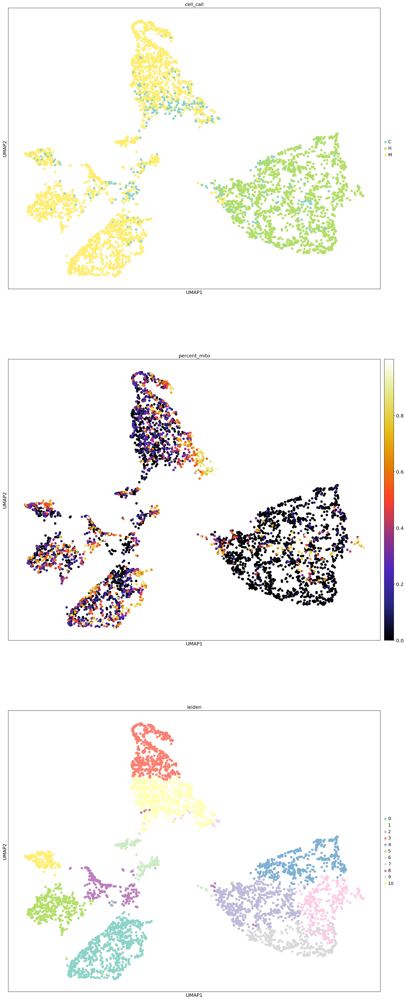

In [1444]:
plt.rcParams['figure.figsize'] = [20, 16]

sc.pl.umap(adata, 
           color=['cell_call','percent_mito','leiden'],
           ncols=1,
           palette="Set3",
           color_map=mpl.cm.CMRmap,
      #     legend_loc='on data',
           size=200)

In [1445]:
sc.tl.rank_genes_groups(adata, 'leiden')
sc.pl.rank_genes_groups(adata, 
                        n_genes=50, 
                 #       groups=[str(3)],
                        ncols=1,
                        fontsize=20,
                        sharey=False
                       )

ranking genes


/Users/derekbogdanoff/projects/venv3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
/Users/derekbogdanoff/projects/venv3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
/Users/derekbogdanoff/projects/venv3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1831: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)


    finished (0:00:02.01) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids


In [1446]:
### define new annotation for celltype based on leiden clusters ####

cell_type_df=pd.DataFrame(adata.obs['leiden'])


def label (row):
   if row['leiden'] == '0':
      return 'mc38'
   if row['leiden'] =='1':
      return 'Hepatocyte'
   if row['leiden'] == '2':
      return 'Hek293t'
   if row['leiden'] == '3':
      return 'Hepatocyte'
   if row['leiden']  == '4':
      return 'Hek293t'
   if row['leiden'] == '5':
      return 'Macrophage'
   if row['leiden'] == '6':
      return 'Hek293t'
   if row['leiden'] == '7':
      return 'Hek293t'
   if row['leiden'] == '8':
      return 'Lymphocyte'
   if row['leiden'] == '9':
      return 'LSEC'
   if row['leiden'] == '10':    
      return 'Kupffer'
    
    
cell_type_df_ =  pd.DataFrame(cell_type_df.apply (lambda row: label(row), axis=1),)

cell_type_df_.columns=['CellType']

adata.obs['CellType']=cell_type_df_



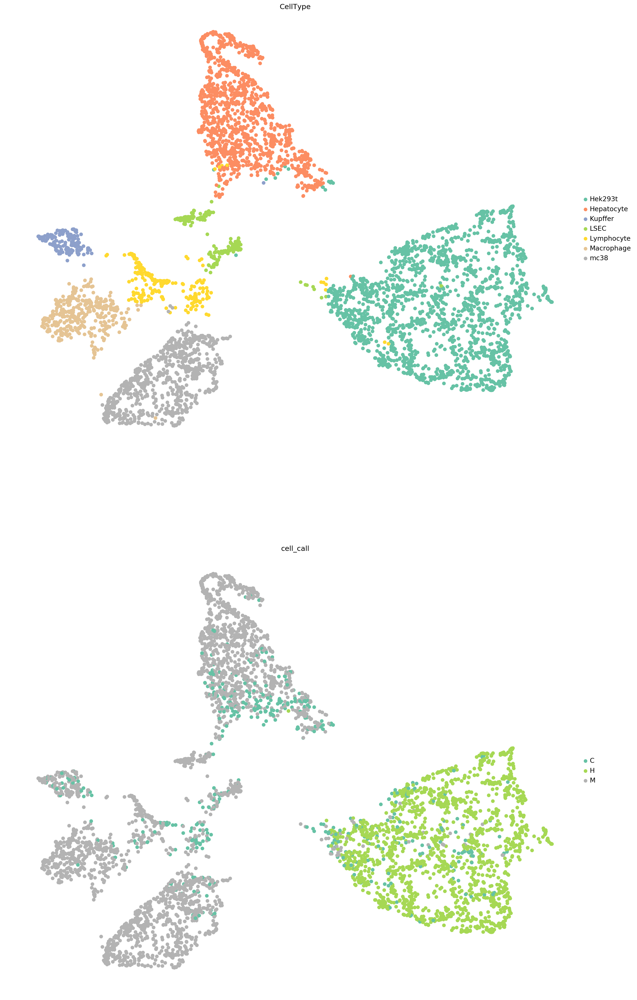

In [1470]:
plt.rcParams['figure.figsize'] = [20, 16]

sc.pl.umap(adata, 
           color=['CellType','cell_call'],
           ncols=1,
           palette="Set2",
           color_map=mpl.cm.CMRmap,
           frameon=False,
        #   legend_loc='on data',
        # save='test.svg',
           size=200,
          )




In [1448]:
adata.uns['CellType_colors']

['#1f77b4', '#ff7f0e', '#279e68', '#d62728', '#aa40fc', '#8c564b', '#e377c2']

In [1449]:
adata.uns['CellType_colors']=['#e41a1c',
                              '#377eb8',
                              '#984ea3',
                              '#ff7f00',
                              '#ffff33',
                              '#f781bf',
                              '#4daf4a']

In [1450]:
from pylab import *

cmap = cm.get_cmap('Set1')    # PiYG

for i in range(cmap.N):
    rgb = cmap(i)[:3] # will return rgba, we take only first 3 so we get rgb
    print(matplotlib.colors.rgb2hex(rgb))

#e41a1c
#377eb8
#4daf4a
#984ea3
#ff7f00
#ffff33
#a65628
#f781bf
#999999


In [1451]:
adata

AnnData object with n_obs × n_vars = 4788 × 789 
    obs: 'n_counts', 'n_genes', 'percent_mito', 'mouse_counts', 'human_counts', 'ratio', 'cell_call', 'leiden', 'louvain', 'CellType'
    var: 'n_cells'
    uns: 'pca', 'neighbors', 'leiden', 'louvain', 'cell_call_colors', 'leiden_colors', 'rank_genes_groups', 'CellType_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [1452]:
adata.obs['barcode']=df['barcode']

In [1341]:
adata

AnnData object with n_obs × n_vars = 4788 × 789 
    obs: 'n_counts', 'n_genes', 'percent_mito', 'mouse_counts', 'human_counts', 'ratio', 'cell_call', 'leiden', 'louvain', 'CellType', 'barcode'
    var: 'n_cells'
    uns: 'pca', 'neighbors', 'leiden', 'louvain', 'cell_call_colors', 'leiden_colors', 'rank_genes_groups', 'CellType_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [1458]:
adata.uns["rank_genes_groups"]

{'params': {'groupby': 'leiden',
  'reference': 'rest',
  'method': 't-test_overestim_var',
  'use_raw': True,
  'corr_method': 'benjamini-hochberg'},
 'scores': rec.array([(30.928335 , 17.94088  , 11.151877 , 39.470398 , 28.48433  , 18.638718 , 24.144304 , 19.205795 , 8.514408 , 9.394726 , 15.460407 ),
            (29.413895 , 15.338476 , 10.489619 , 33.350155 , 25.994226 , 17.040384 , 24.033068 , 18.591606 , 8.284304 , 8.862036 , 12.89685  ),
            (28.117542 , 15.28949  ,  7.2842155, 33.22678  , 25.777569 , 15.769059 , 20.41395  , 15.00026  , 8.227359 , 8.61482  , 12.179902 ),
            (25.381634 , 14.092407 ,  6.8488436, 32.111732 , 24.211544 , 15.148917 , 19.700083 , 14.189016 , 7.141742 , 8.209577 , 10.41317  ),
            (24.53655  , 13.672046 ,  5.582834 , 30.46889  , 22.97294  , 14.893652 , 19.618599 , 14.131254 , 6.9222484, 8.180607 , 10.292681 ),
            (24.062756 , 12.851749 ,  5.4302263, 27.247057 , 22.813578 , 14.825406 , 19.251774 , 13.410929 , 6.382985 ,

In [1486]:
def rank_genes_groups_df(adata, group, pval_cutoff : float =None, logfc_cutoff=None): 
    d = pd.DataFrame() 
    for k in ['scores', 'names', 'logfoldchanges', 'pvals', 'pvals_adj']: 
        d[k] = adata.uns["rank_genes_groups"][k][group] 
    if pval_cutoff is not None: 
        d = d[d["pvals_adj"] < pval_cutoff] 
    if logfc_cutoff is not None: 
        d = d[d["logfoldchanges"].abs() > logfc_cutoff] 
    return d

de_df = rank_genes_groups_df(adata)

de_df.hvplot.scatter(
    "logfoldchanges", "pvals", 
    flip_yaxis=True, logy=True, 
    hover_cols=["names"]
)

TypeError: rank_genes_groups_df() missing 1 required positional argument: 'group'

In [1002]:
adata.obs['barcode']=df['barcode']

In [218]:
plate_map='../XYZeq/data/20181219_species_exp/plate23_map.csv'
spatial_map=pd.read_csv(plate_map, header=None, names=['barcode', 'X', 'Y'])

In [219]:
cutoff=0

In [220]:
def hexagon(x, y, c='k'):
	from matplotlib.patches import Polygon

	points = [[x + (2/3), y],
			  [x + (1/3), y + 0.5],
   			  [x - (1/3), y + 0.5],
              [x - (2/3), y],
   			  [x - (1/3), y - 0.5],
   			  [x + (1/3), y - 0.5]]
    
	polygon = Polygon(points, edgecolor='w', fc=c)
	return polygon

In [1467]:

df=pd.DataFrame(adata.obs.CellType )


In [1468]:
df['barcode']=df.index.str[-16:]

/Users/derekbogdanoff/projects/venv3/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # This is added back by InteractiveShellApp.init_path()


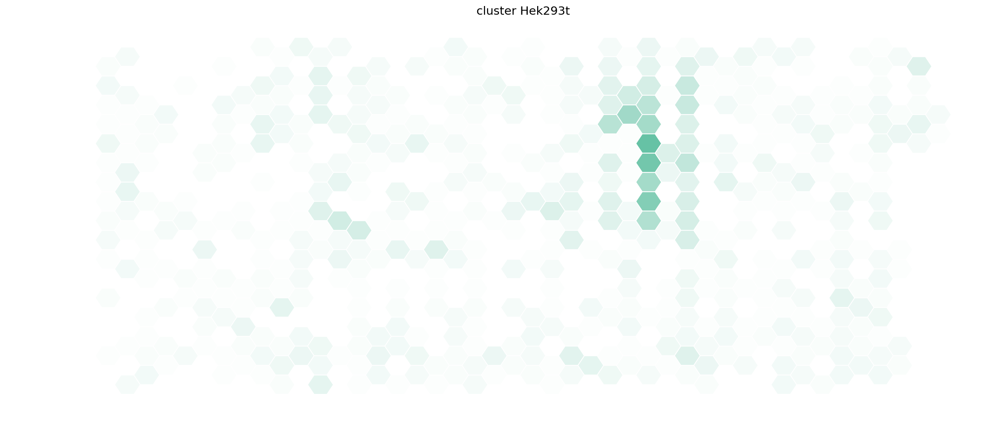

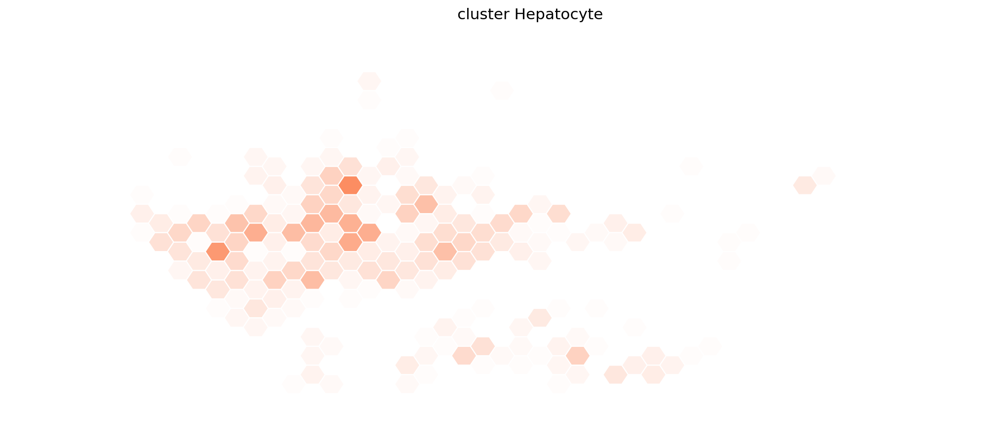

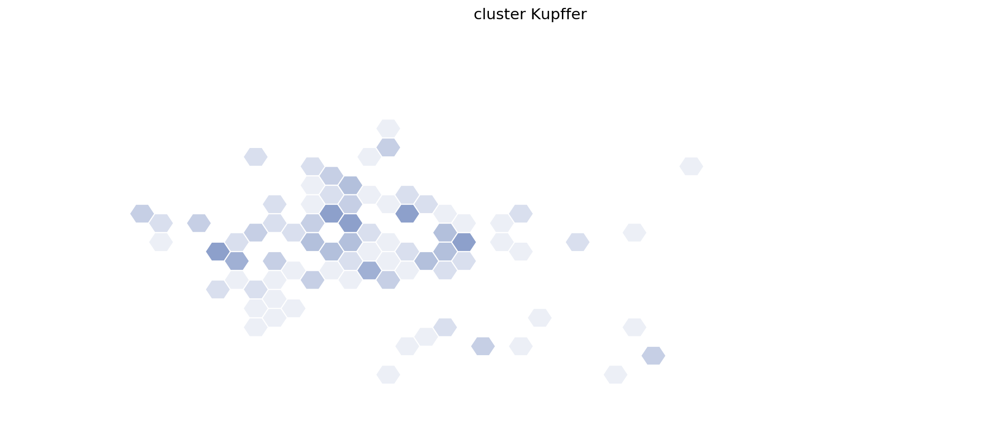

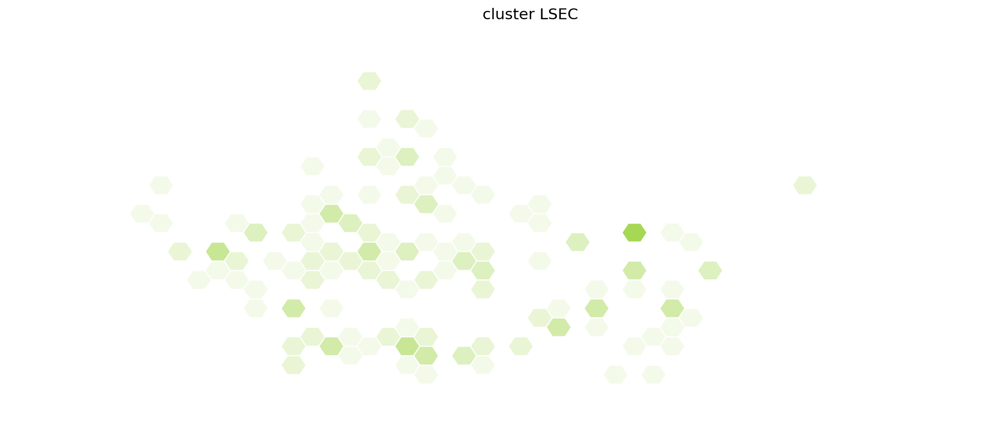

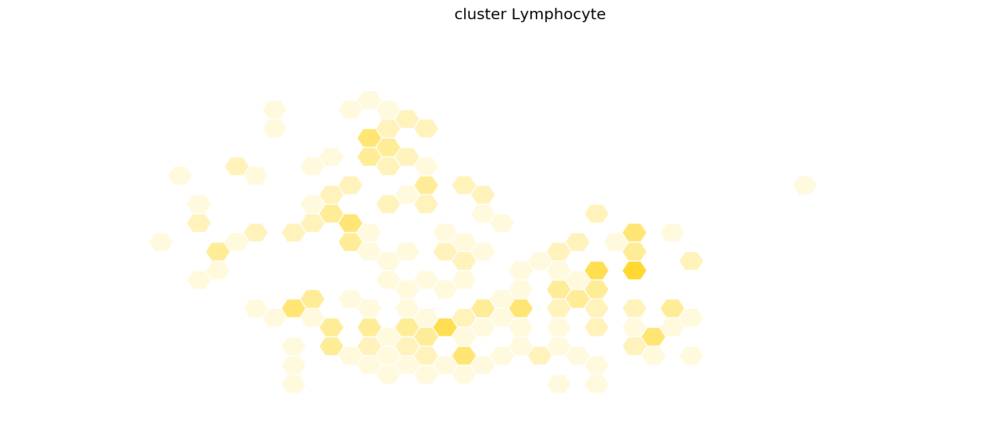

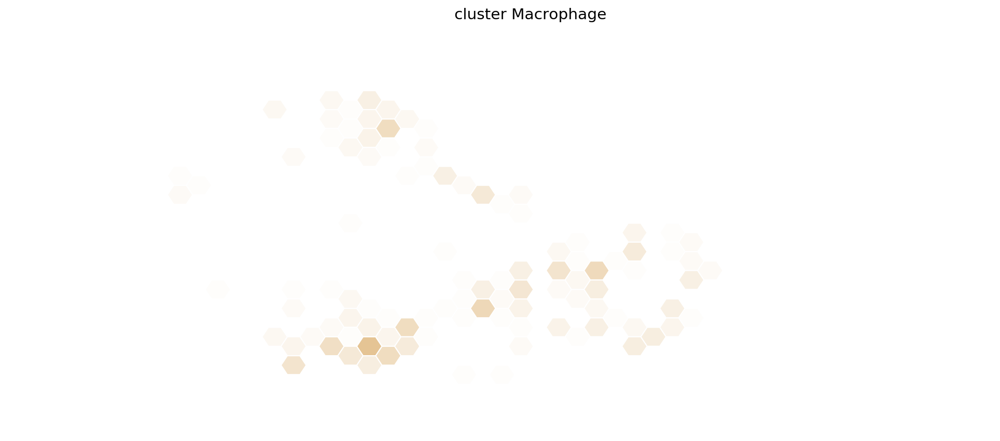

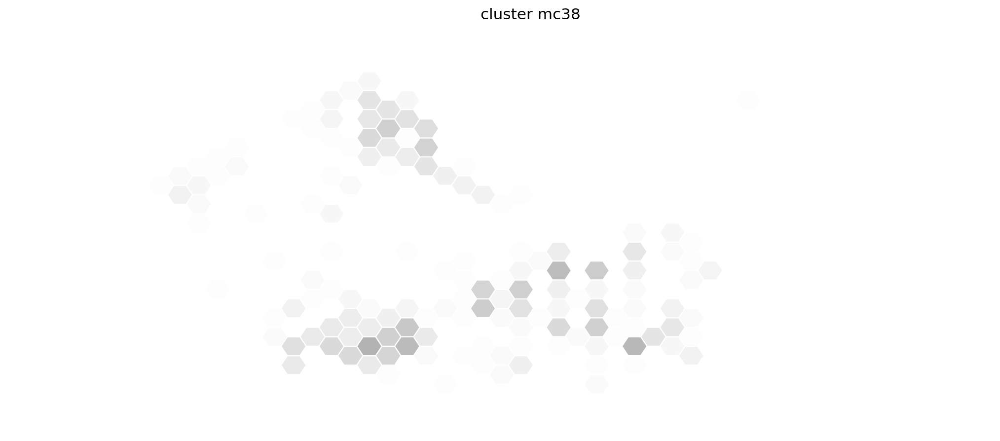

In [1471]:

color_itorator=0



for t in adata.obs.CellType.cat.categories:
#for t in ['1']:
    df_=df[df['CellType'] == t]
    
    #sets cell counter
    df_['count']=1
    
    df__=df_.groupby('barcode', as_index=False)['count'].sum()

    map_array=spatial_map.merge(df__, on='barcode', how='left')
    
    map_array=map_array.fillna('0')
    map_array['count']=map_array['count'].astype(int)
    
    
    
    # max value for coloring
    max_val=max(map_array['count'])
    norm = mpl.colors.Normalize(vmin=0,vmax=max_val)
    
    custom_color=adata.uns['CellType_colors'][color_itorator]
    custom_map = mpl.colors.LinearSegmentedColormap.from_list("", ["#ffffff",custom_color])
    
    color_itorator = color_itorator+1
    
    count_hex=[]
    for i in map_array['count']:
        if i > cutoff:

            count_hex.append(mpl.colors.rgb2hex(custom_map(norm(i))[:3]))
        #    count_hex.append('#000000')
            
        else:
            count_hex.append('#ffffff')

    map_array['color']=count_hex
    
    for index, row in map_array.iterrows():
        if row['X'] % 2 != 0:
            row['Y']=row['Y']-0.5
    
        polygon = hexagon(row['X'],row['Y'],row['color'])
        plt.gca().add_patch(polygon)
    
  
    plt.ylim(18,0) #flip y axis
    plt.axis('scaled')
    plt.rcParams['figure.figsize'] = [15, 7.5] 
    
    plt.ylabel('cell number')
    plt.title('cluster %s' %t) 
    plt.axis('off')

    
    
    
    
#fix this here...
 #   mesh = plt.pcolormesh(pd.DataFrame(map_array['count']), cmap=custom_map)
 #   plt.colorbar(mesh)
    
 #   plt.savefig('/Users/derekbogdanoff/Desktop/test.svg', bbox_inches='tight')
    plt.show()

In [1105]:
df=pd.DataFrame(adata.obs.cell_call )



In [1106]:
df['barcode']=df.index.str[-16:]

/Users/derekbogdanoff/projects/venv3/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


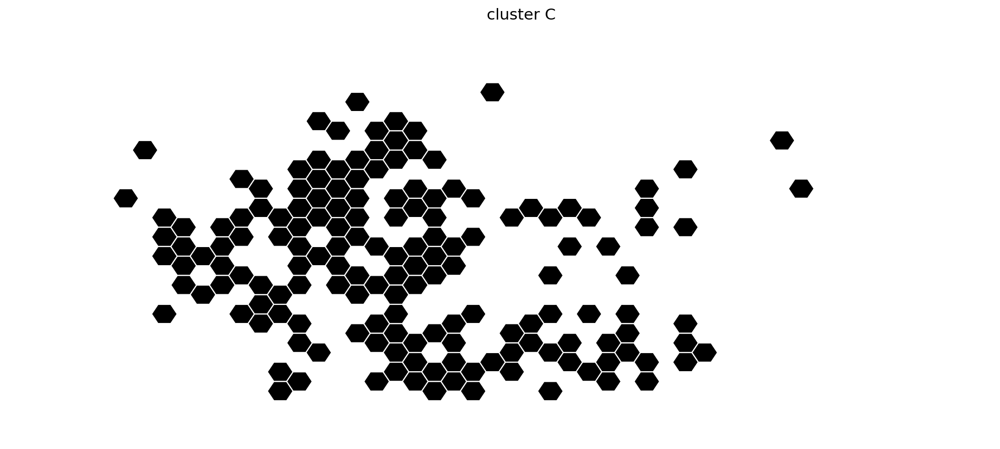

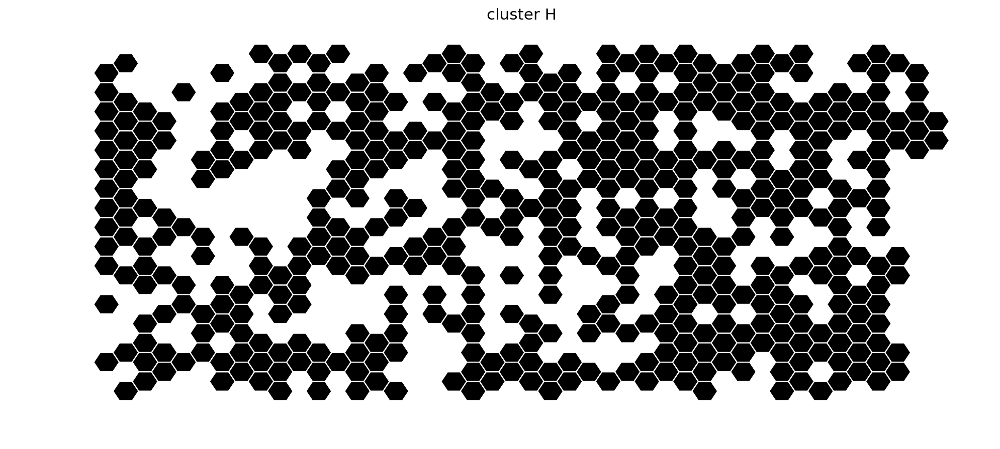

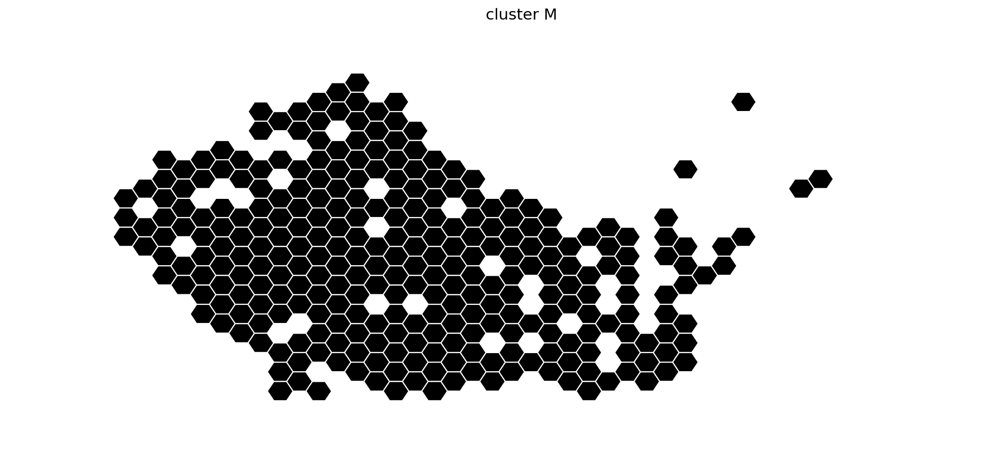

In [1107]:
#color_itorator=0

for t in adata.obs.cell_call.cat.categories:
#for t in ['1']:
    df_=df[df['cell_call'] == t]
    
    #sets cell counter
    df_['count']=1
    
    df__=df_.groupby('barcode', as_index=False)['count'].sum()

    map_array=spatial_map.merge(df__, on='barcode', how='left')
    
    map_array=map_array.fillna('0')
    map_array['count']=map_array['count'].astype(int)
    
    
    
    # max value for coloring
    max_val=max(map_array['count'])
    norm = mpl.colors.Normalize(vmin=0,vmax=max_val)
    
#     custom_color=adata.uns['CellType_colors'][color_itorator]
#     custom_map = mpl.colors.LinearSegmentedColormap.from_list("", ["#ffffff",custom_color])
    
#     color_itorator = color_itorator+1
    
    count_hex=[]
    for i in map_array['count']:
        if i > cutoff:

        #    count_hex.append(mpl.colors.rgb2hex(mpl.cm.plasma(norm(i))[:3]))
            count_hex.append('#000000')
            
        else:
            count_hex.append('#ffffff')

    map_array['color']=count_hex
    
    for index, row in map_array.iterrows():
        if row['X'] % 2 != 0:
            row['Y']=row['Y']-0.5
    
        polygon = hexagon(row['X'],row['Y'],row['color'])
        plt.gca().add_patch(polygon)
    
  
    plt.ylim(18,0) #flip y axis
    plt.axis('scaled')
    plt.rcParams['figure.figsize'] = [15, 7.5] 
    plt.title('cluster %s' %t) 
    plt.axis('off')
    
    
#fix this here...
   # mesh = plt.pcolormesh(pd.DataFrame(map_array['count']), cmap=mpl.cm.plasma)
    #plt.colorbar(mesh)
    
 #   plt.savefig('/Users/derekbogdanoff/Desktop/test.svg', bbox_inches='tight')
    plt.show()

/Users/derekbogdanoff/projects/venv3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


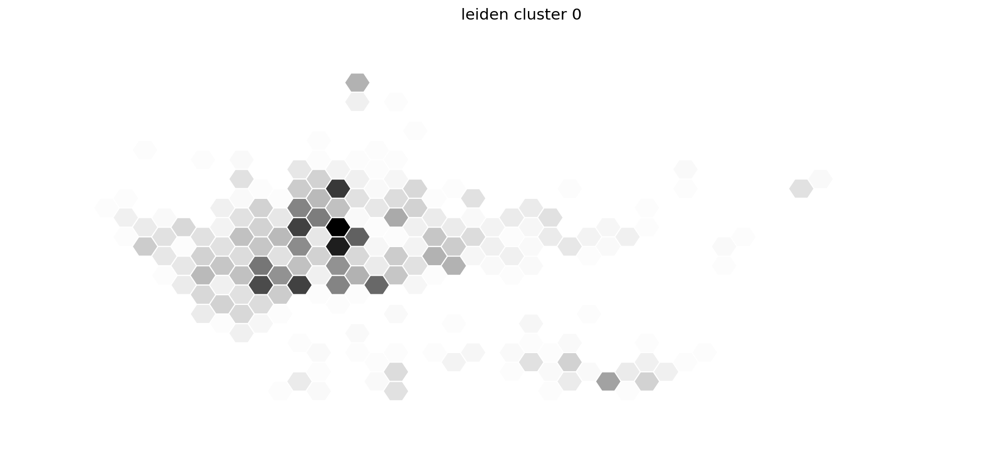

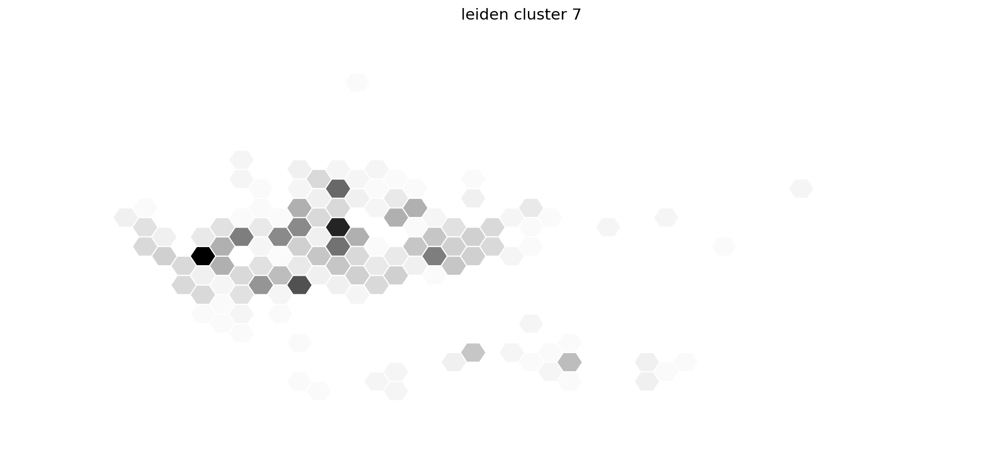

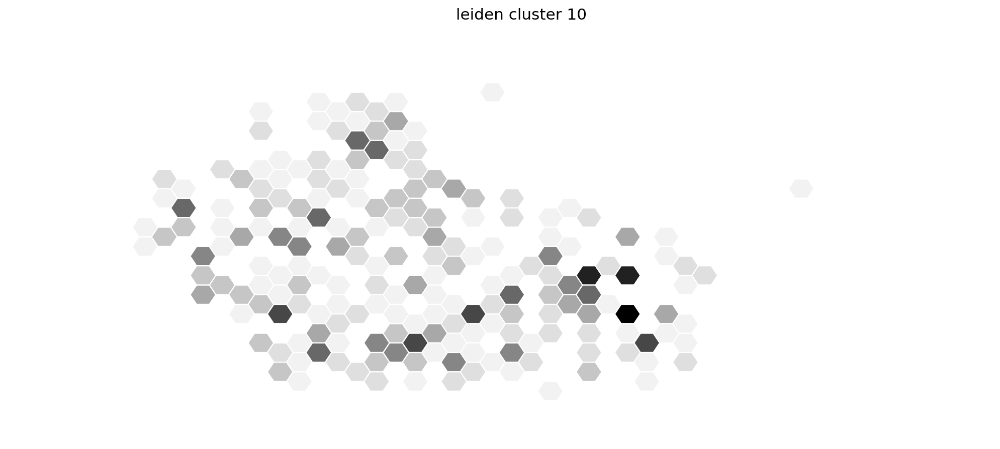

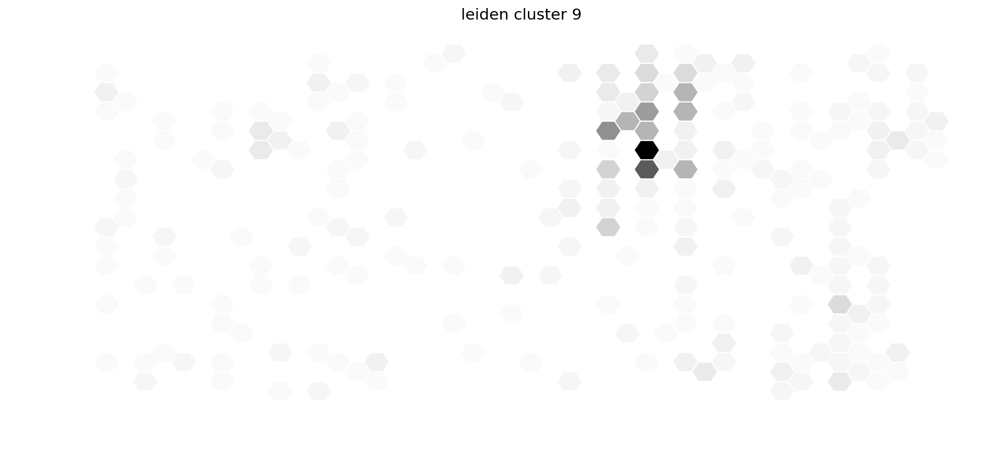

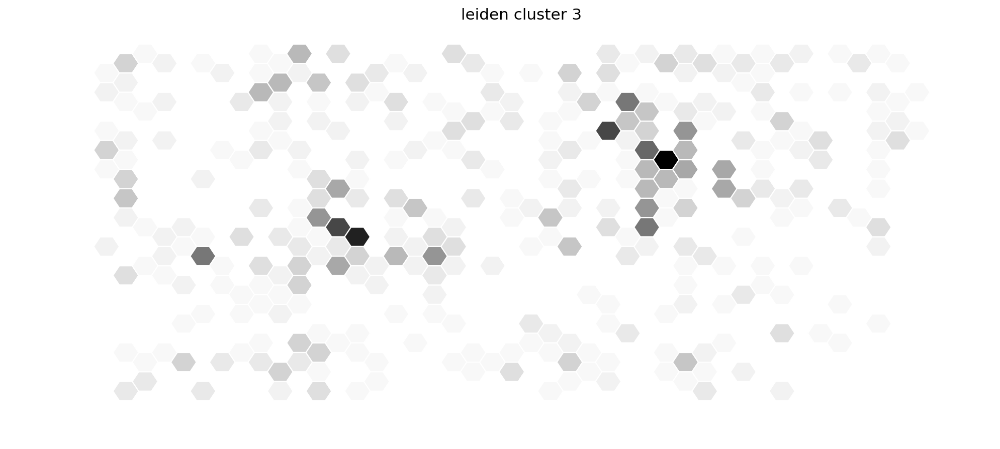

...

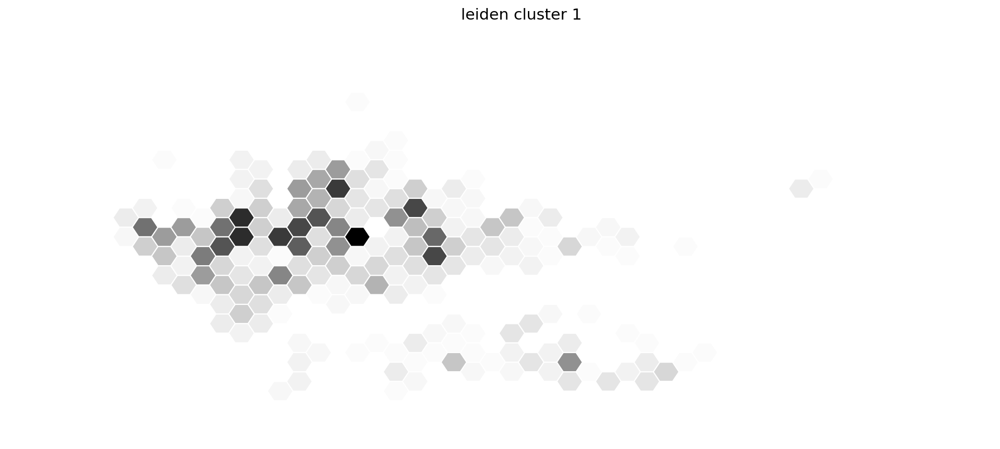

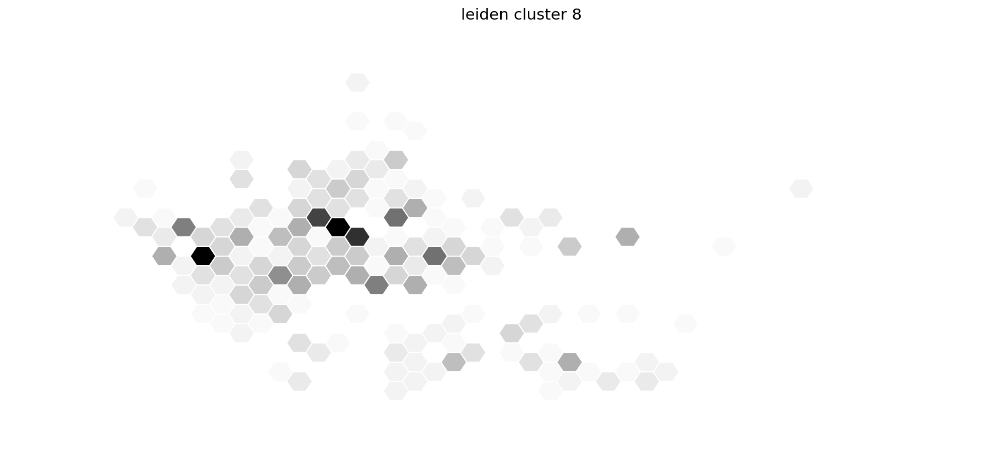

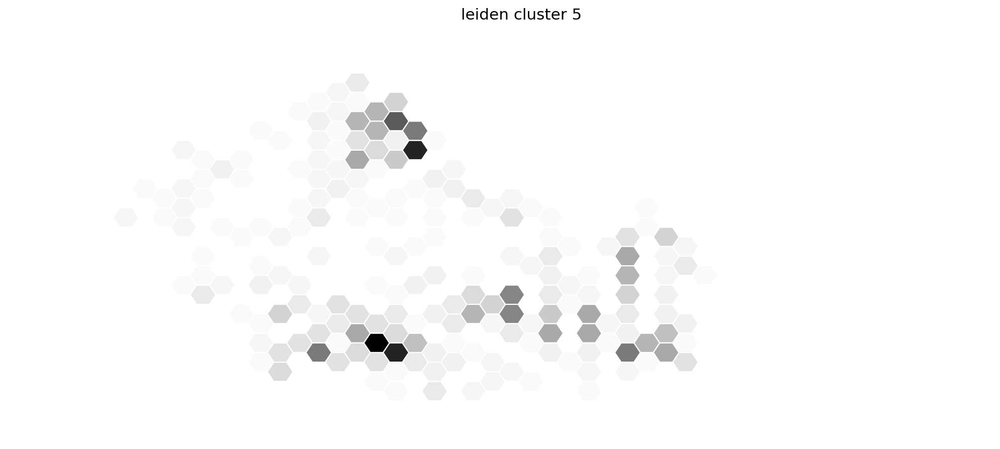

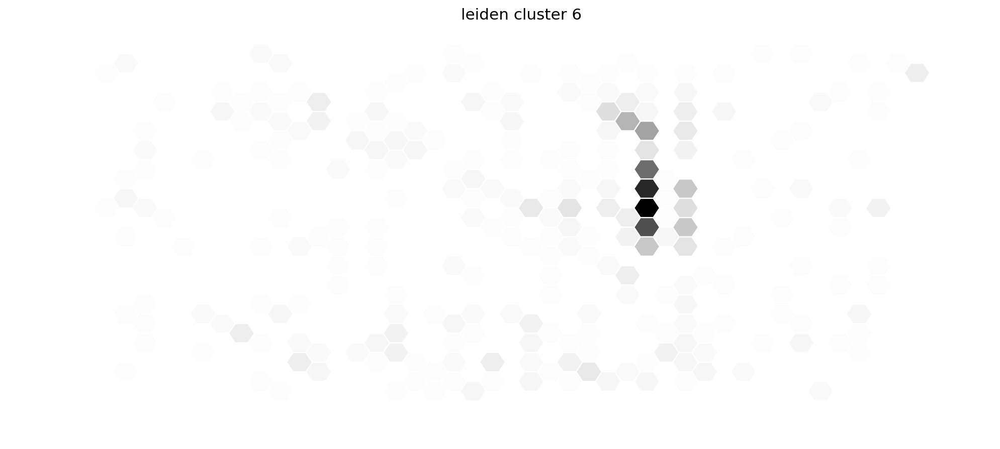

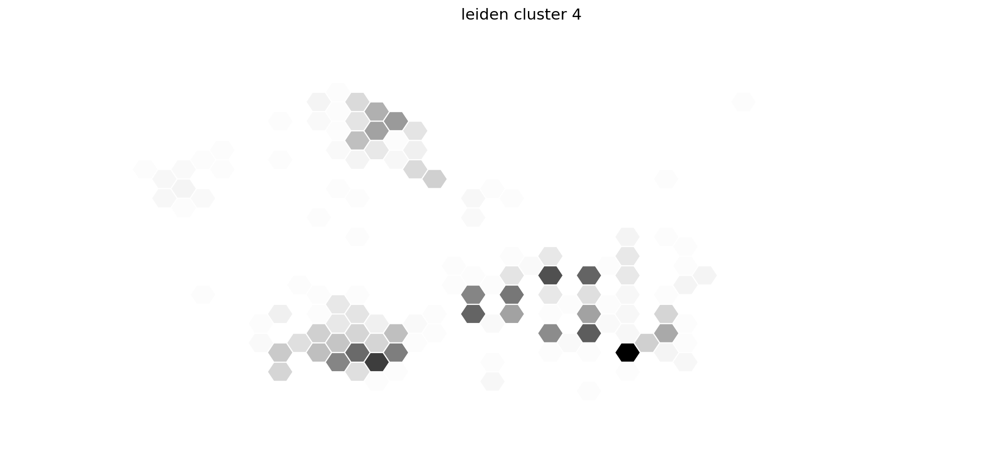

In [84]:
for t in adata_filtered.obs.leiden.unique():        #for each unique feature in adata.obs
    df_=df[df['leiden'] == t]
    df_['count']=1
    
    df__=df_.groupby('barcode', as_index=False)['count'].sum()
#    df__.columns=['barcode','count']
    map_array=spatial_map.merge(df__, on='barcode', how='left')
    
    map_array=map_array.fillna('0')
    map_array['count']=map_array['count'].astype(int)
    
    max_val=max(map_array['count'])
    norm = mpl.colors.Normalize(vmin=0,vmax=max_val)
    
    
 #   cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["white","#1f77b4"])
    
    
    
    
    count_hex=[]
    for i in map_array['count']:
        if i > cutoff:

            count_hex.append(mpl.colors.rgb2hex(cm.Greys(norm(i))[:3]))
            #count_hex.append('#E6E6FA')
            
        else:
            count_hex.append('#ffffff')

    map_array['color']=count_hex
    
    
    
    
    
    
    for index, row in map_array.iterrows():
        if row['X'] % 2 != 0:
            row['Y']=row['Y']-0.5
    
        polygon = hexagon(row['X'],row['Y'],row['color'])
        plt.gca().add_patch(polygon)
    
  
    plt.ylim(18,0) #flip y axis
    plt.axis('scaled')
    plt.rcParams['figure.figsize'] = [15, 7.5] 
    plt.title('leiden cluster %s' %t) 
    plt.axis('off')
    
 #   plt.colorbar()
    
    plt.show()

In [966]:
_df=df.merge(spatial_map,on='barcode',how='right')

_df['count']=1

_df['CellType']=_df['CellType'].cat.add_categories('None').fillna('None')
_df['count']=_df['count'].fillna(int(1))

df_=_df.groupby(['barcode','CellType'])['count'].sum()

df__=pd.DataFrame(df_)

In [968]:
adata.uns['CellType_colors']

['#b3b3b3', '#fc8d62', '#8da0cb', '#a6d854', '#ffd92f', '#e78ac3', '#66c2a5']

In [1014]:
# #CellType Color_dict
# color_dict={'Hek293t':'#b3b3b3', 
#             'Hepatocyte':'#fc8d62',
#             'Kupffer':'#8da0cb',
#             'LSEC':'#a6d854',
#             'Lymphocyte':'#ffd92f',
#             'Macrophage':'#e78ac3',
#             'mc38':'#66c2a5',
#             'None':'#ffffff'}




color_dict={'Hek293t':'#e41a1c', 
            'Hepatocyte':'#377eb8',
            'Kupffer':'#984ea3',
            'LSEC':'#ff7f00',
            'Lymphocyte':'#ffff33',
            'Macrophage':'#f781bf',
            'mc38':'#4daf4a',
            'None':'#ffffff'}





# #Cell_call color dict
# color_dict={'M':'orangered', 
#             'H':'royalblue',
#             'C':'lightgrey',
#             'None':'#ffffff',}



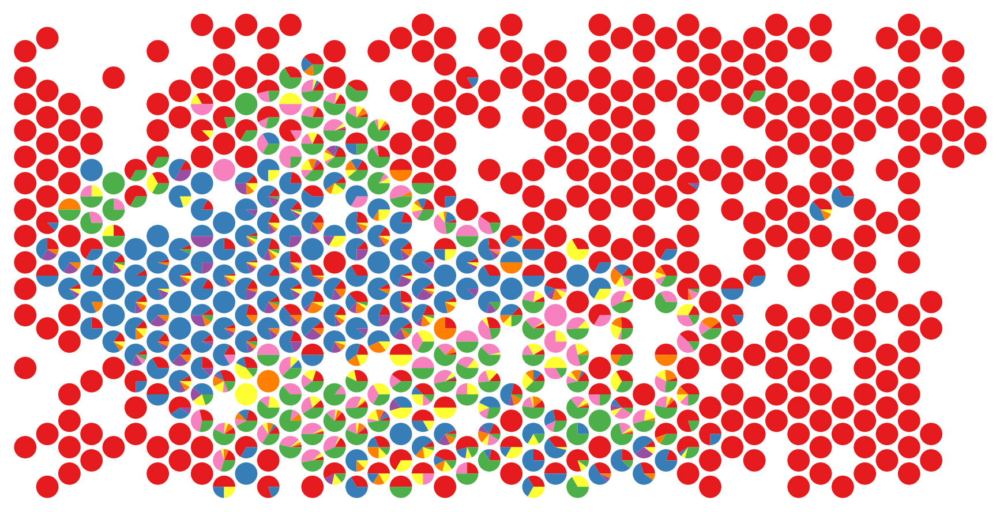

In [1015]:
fig8 = plt.figure(constrained_layout=False)



gs1 = fig8.add_gridspec(nrows=36, ncols=44, left=-0.05, right=0.48, hspace=-0.98,wspace=-.21)


for index, row in spatial_map.iterrows():
    x_coordinate = row['X']-1
    
    if (row['X']-1)  % 2 == 0:
        y_coordinate = ((row['Y']-1)*2)
    else:
        y_coordinate = ((row['Y']*2)-1)
    
    
    
    barcode=str(row['barcode'])
    
    
    data=df__.loc[barcode]
    counts=data['count'].tolist()
    
    
    #print([y_coordinate, x_coordinate])
    
    
    color_list=[]
    for i in data.index.tolist():
        color_list.append(color_dict[i])
    
    
    ax = fig8.add_subplot(gs1[y_coordinate,x_coordinate])
    ax.pie(counts, colors=color_list)
    
    
  #  df__.loc[barcode].plot.pie('count')
fig8.savefig('/Users/derekbogdanoff/Desktop/test.svg', bbox_inches='tight')

In [1089]:
_df=df.merge(spatial_map,on='barcode',how='right')

_df['count']=1

_df['CellType']=_df['CellType'].cat.add_categories('None').fillna('None')
_df['count']=_df['count'].fillna(int(1))

df_=_df.groupby(['barcode','CellType'])['count'].sum()

df__=pd.DataFrame(df_)


In [1090]:
def rand_jitter(arr):
    stdev = .005*(max(arr)-min(arr))
    return arr + np.random.randn(len(arr)) * stdev

In [1091]:
#_df

In [1092]:
list_=[]

for index, row in _df.iterrows():
    if row['X'] % 2 != 0:
        row['Y']=row['Y']-0.5
    else:  
        row['Y']=row['Y']
        
    list_.append(row['Y'])
        

In [1093]:
_df['Y']=list_

In [1094]:
_df['Y']=_df['Y']/2

In [1462]:
test=_df

In [1463]:
test['color']=test['CellType'].map(color_dict)

In [1464]:
test['X']=rand_jitter(test['X'])
test['Y']=rand_jitter(test['Y'])

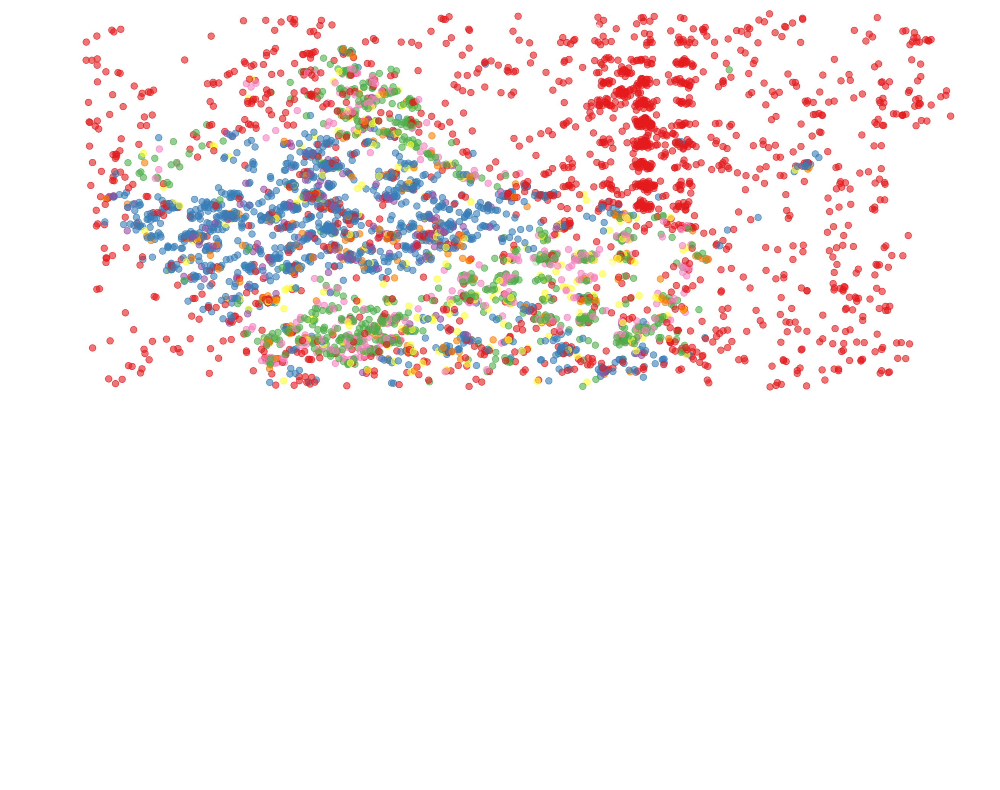

In [1465]:
test.plot.scatter(x='X',y='Y',c=test['color'], s=60,alpha=.6)
plt.ylim(18,0)

plt.axis('off')
plt.grid(b=None)

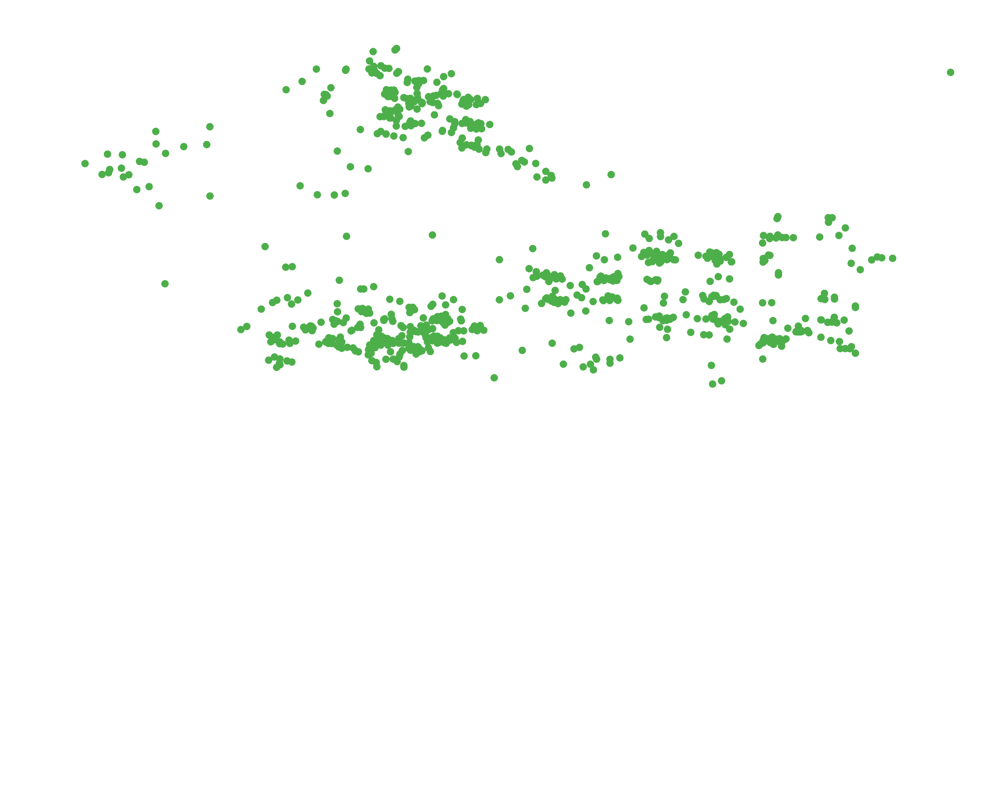

In [1080]:

test[test['CellType']=='mc38'].plot.scatter(x='X',y='Y',c=test[test['CellType']=='mc38']['color'], s=60)
plt.ylim(18,0)

plt.axis('off')
plt.grid(b=None)

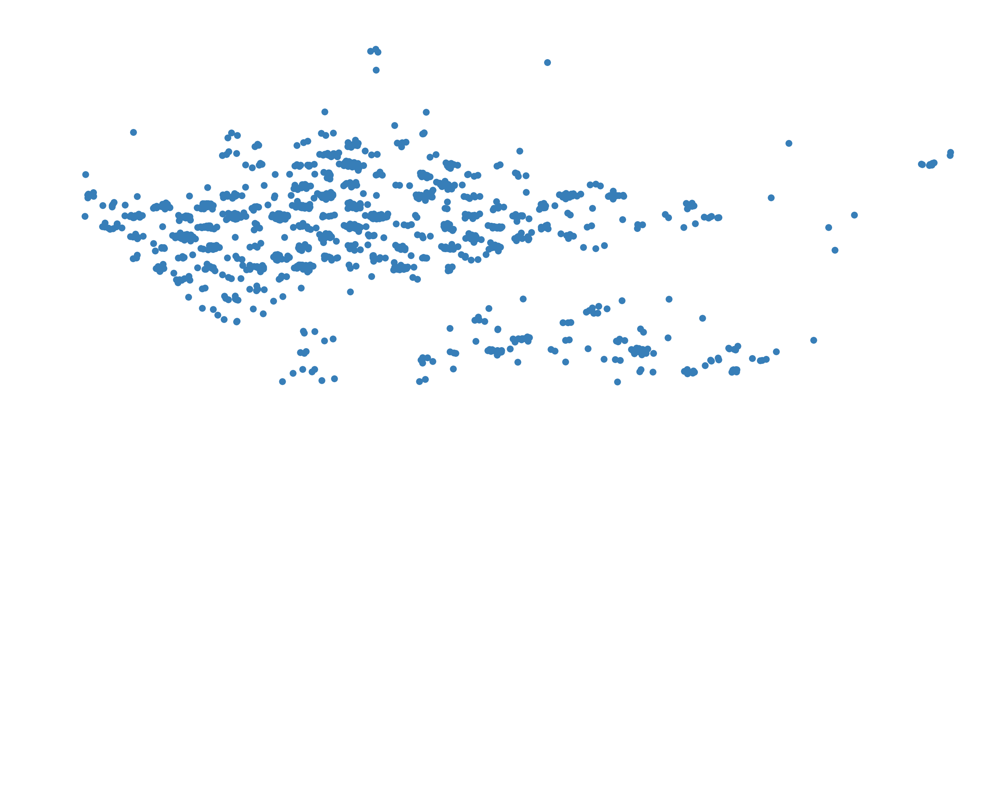

In [1029]:

test[test['CellType']=='Hepatocyte'].plot.scatter(x='X',
                                                  y='Y',
                                                  c=test[test['CellType']=='Hepatocyte']['color'],
                                                  s=50)
plt.ylim(18,0)

plt.axis('off')
plt.grid(b=None)

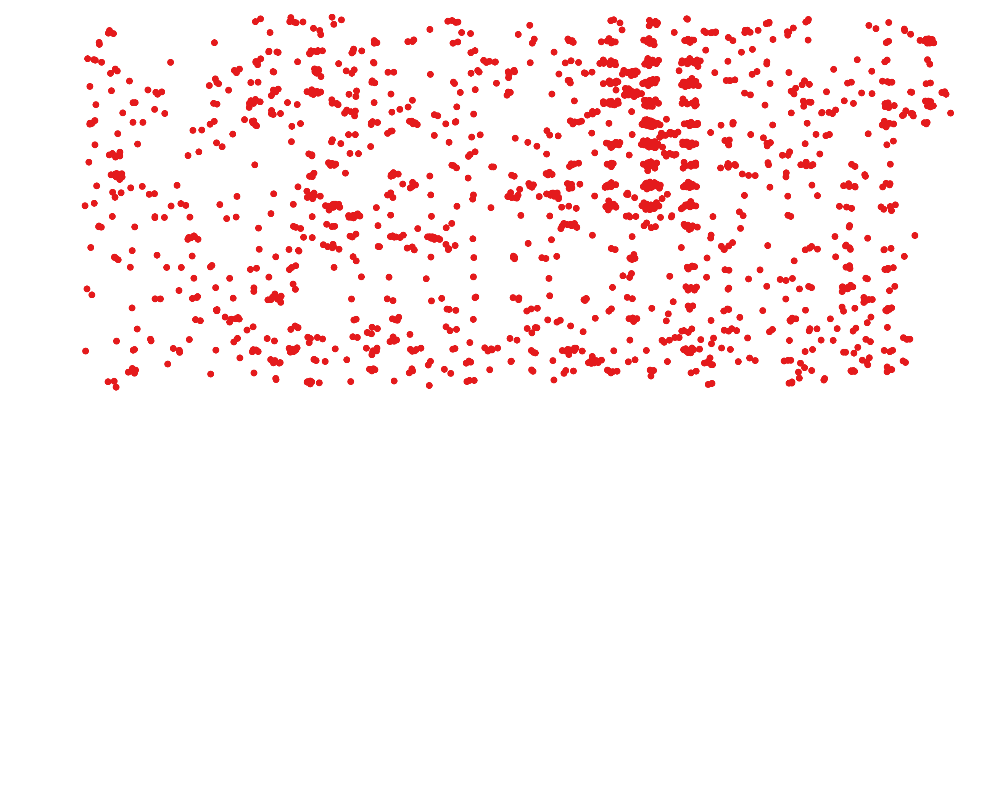

In [1030]:

test[test['CellType']=='Hek293t'].plot.scatter(x='X',
                                           y='Y',
                                               c=test[test['CellType']=='Hek293t']['color'],
                                               s=50)
plt.ylim(18,0)

plt.axis('off')
plt.grid(b=None)